# Random Forest Assignment

**Content**:

* Calling Libraries
1. Bank Marketing Dataset
<ul>
    <li>Load the dataset</li>
    <li>EDA</li>
    <li>Random Forest Model For Classification</li>
    <li>Random Forest Model using GridSearch CV Classification</li>
</ul>
<br>
2. U.S. Pollution Dataset
<ul>
    <li>Load the dataset</li>
    <li>EDA</li>
    <li>Random Forest Model For Regression</li>
    <li>Random Forest Model using GridSearch CV Regression</li>
</ul>

Sources:

https://archive.ics.uci.edu/ml/datasets/Bank+Marketing

https://www.kaggle.com/datasets/sogun3/uspollution

### Calling Libraries

In [197]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler

# This is for regression
from sklearn.tree import DecisionTreeRegressor 
from sklearn.ensemble import RandomForestRegressor

# This is for classification
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline


from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn import tree

import warnings
warnings.filterwarnings('ignore')
#plt.style.use("seaborn")

## 1. Bank Marketing Dataset

### Load the dataset

In [184]:
df = pd.read_csv('bank_full.csv')

### EDA

In [87]:
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [88]:
df.shape

(45211, 17)

Citation Request:
  This dataset is public available for research. The details are described in [Moro et al., 2011]. 
  Please include this citation if you plan to use this database:

  [Moro et al., 2011] S. Moro, R. Laureano and P. Cortez. Using Data Mining for Bank Direct Marketing: An Application of the CRISP-DM Methodology. 
  In P. Novais et al. (Eds.), Proceedings of the European Simulation and Modelling Conference - ESM'2011, pp. 117-121, Guimarães, Portugal, October, 2011. EUROSIS.

  Available at: [pdf] http://hdl.handle.net/1822/14838
                [bib] http://www3.dsi.uminho.pt/pcortez/bib/2011-esm-1.txt

1. Title: Bank Marketing

2. Sources
   Created by: Paulo Cortez (Univ. Minho) and Sérgio Moro (ISCTE-IUL) @ 2012
   
3. Past Usage:

  The full dataset was described and analyzed in:

  S. Moro, R. Laureano and P. Cortez. Using Data Mining for Bank Direct Marketing: An Application of the CRISP-DM Methodology. 
  In P. Novais et al. (Eds.), Proceedings of the European Simulation and Modelling Conference - ESM'2011, pp. 117-121, Guimarães, 
  Portugal, October, 2011. EUROSIS.

4. Relevant Information:

   The data is related with direct marketing campaigns of a Portuguese banking institution. 
   The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, 
   in order to access if the product (bank term deposit) would be (or not) subscribed. 

   There are two datasets: 
      1) bank-full.csv with all examples, ordered by date (from May 2008 to November 2010).
      2) bank.csv with 10% of the examples (4521), randomly selected from bank-full.csv.
   The smallest dataset is provided to test more computationally demanding machine learning algorithms (e.g. SVM).

   The classification goal is to predict if the client will subscribe a term deposit (variable y).

5. Number of Instances: 45211 for bank-full.csv (4521 for bank.csv)

6. Number of Attributes: 16 + output attribute.

7. Attribute information:

   For more information, read [Moro et al., 2011].

   Input variables:
   # bank client data:
   1 - age (numeric)
   
   2 - job : type of job (categorical: "admin.","unknown","unemployed","management","housemaid","entrepreneur","student",
                                       "blue-collar","self-employed","retired","technician","services") 
                                       
   3 - marital : marital status (categorical: "married","divorced","single"; note: "divorced" means divorced or widowed)
   
   4 - education (categorical: "unknown","secondary","primary","tertiary")
   
   5 - default: has credit in default? (binary: "yes","no")
   
   6 - balance: average yearly balance, in euros (numeric) 
   
   7 - housing: has housing loan? (binary: "yes","no")
   
   8 - loan: has personal loan? (binary: "yes","no")
   
   # related with the last contact of the current campaign:
   9 - contact: contact communication type (categorical: "unknown","telephone","cellular") 
   
  10 - day: last contact day of the month (numeric)
  
  11 - month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")
  
  12 - duration: last contact duration, in seconds (numeric)
  
   # other attributes:
  13 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
  
  14 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric, -1 means client was not previously contacted)
  
  15 - previous: number of contacts performed before this campaign and for this client (numeric)
  
  16 - poutcome: outcome of the previous marketing campaign (categorical: "unknown","other","failure","success")
  

  Output variable (desired target):
  
  17 - y - has the client subscribed a term deposit? (binary: "yes","no")
  

8. Missing Attribute Values: None

In [89]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [185]:
df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [90]:
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [91]:
df.describe(exclude='number')

,job,marital,education,default,housing,loan,contact,month,poutcome,y
count,45211,45211,45211,45211,45211,45211,45211,45211,45211,45211
unique,12,3,4,2,2,2,3,12,4,2
top,blue-collar,married,secondary,no,yes,no,cellular,may,unknown,no
freq,9732,27214,23202,44396,25130,37967,29285,13766,36959,39922


In [188]:
# lets chnage the names of our columns for simplicity 

col_names = {'y': 'bank_term_deposit','default':'has_credit','housing':'has_housing_loan','loan':'has_personal_loan'}

df.rename(columns=col_names, inplace= True)

In [189]:
# Binarize some columns
df['bank_term_deposit'] = df['bank_term_deposit'].map({'yes': 1, 'no': 0})
df['has_credit'] = df['has_credit'].map({'yes': 1, 'no': 0})
df['has_housing_loan'] = df['has_housing_loan'].map({'yes': 1, 'no': 0})
df['has_personal_loan'] = df['has_personal_loan'].map({'yes': 1, 'no': 0})
df.head()

,age,job,marital,education,has_credit,balance,has_housing_loan,has_personal_loan,contact,day,month,duration,campaign,pdays,previous,poutcome,bank_term_deposit
0,58,management,married,tertiary,0,2143,1,0,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,0,29,1,0,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,0,2,1,1,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,0,1506,1,0,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,0,1,0,0,unknown,5,may,198,1,-1,0,unknown,0


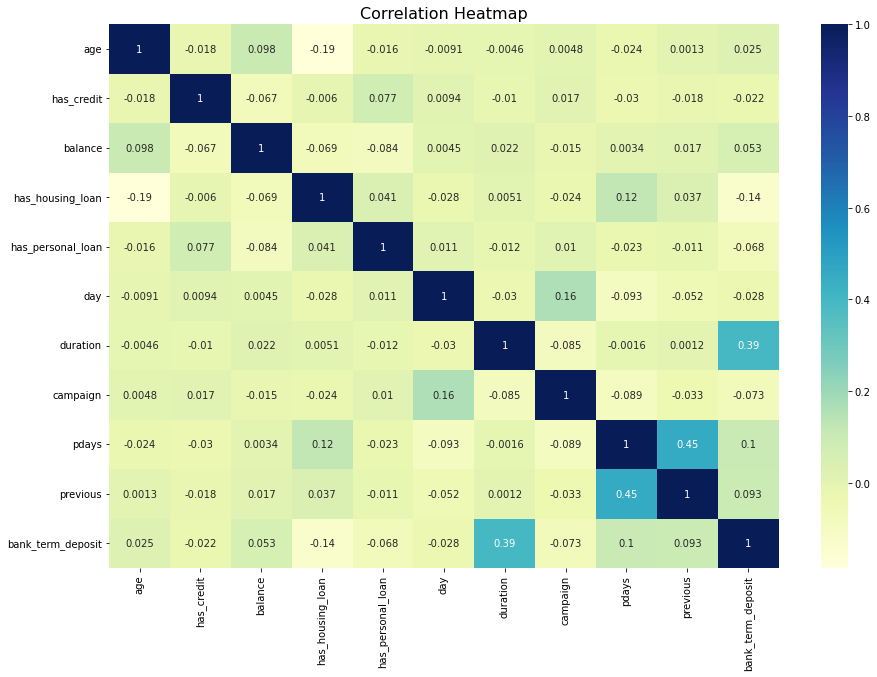

In [94]:
corr=df.corr()# Set the width and height of the figure
plt.figure(figsize=(15,10))
# Add title
plt.title("Correlation Heatmap", size=16)
sns.heatmap(df.corr(), annot=True, cmap="YlGnBu")
#plt.savefig("corr_heatmap.png", format="png", dpi=1200)
plt.show()

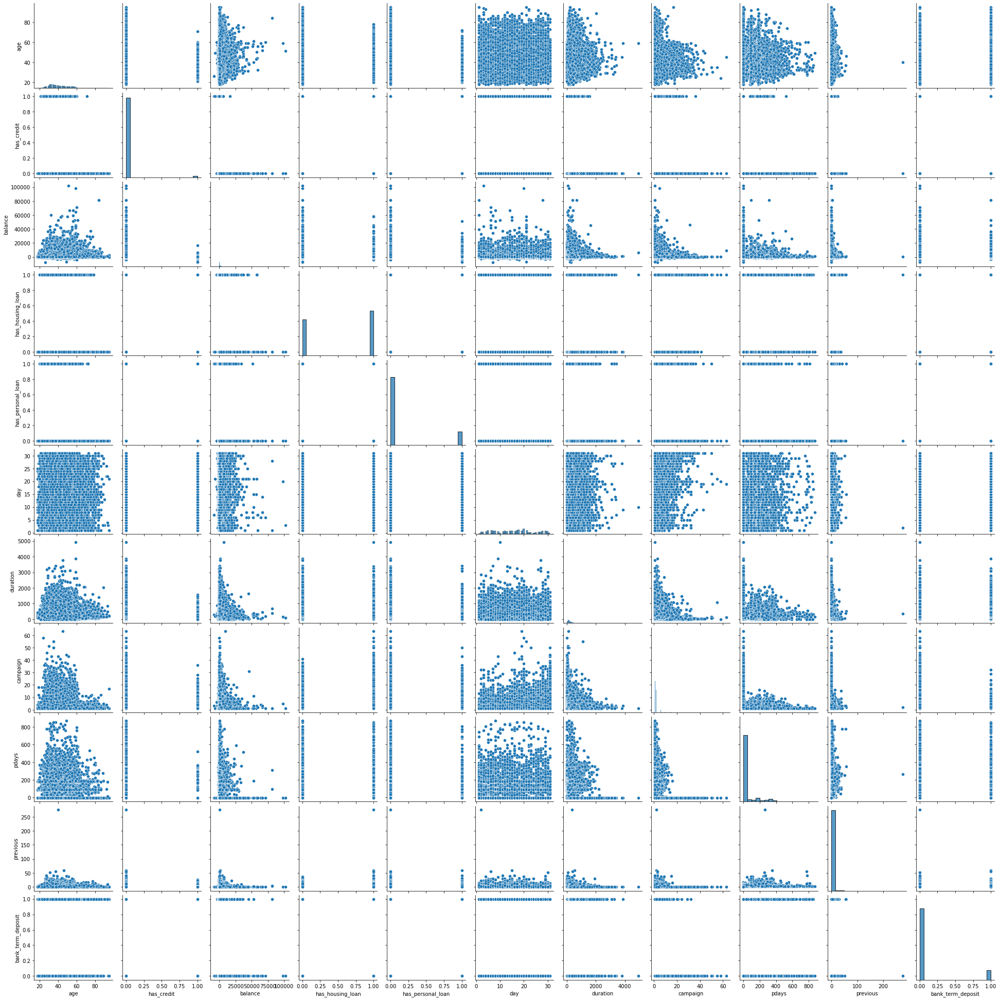

In [95]:
sns.pairplot(df)

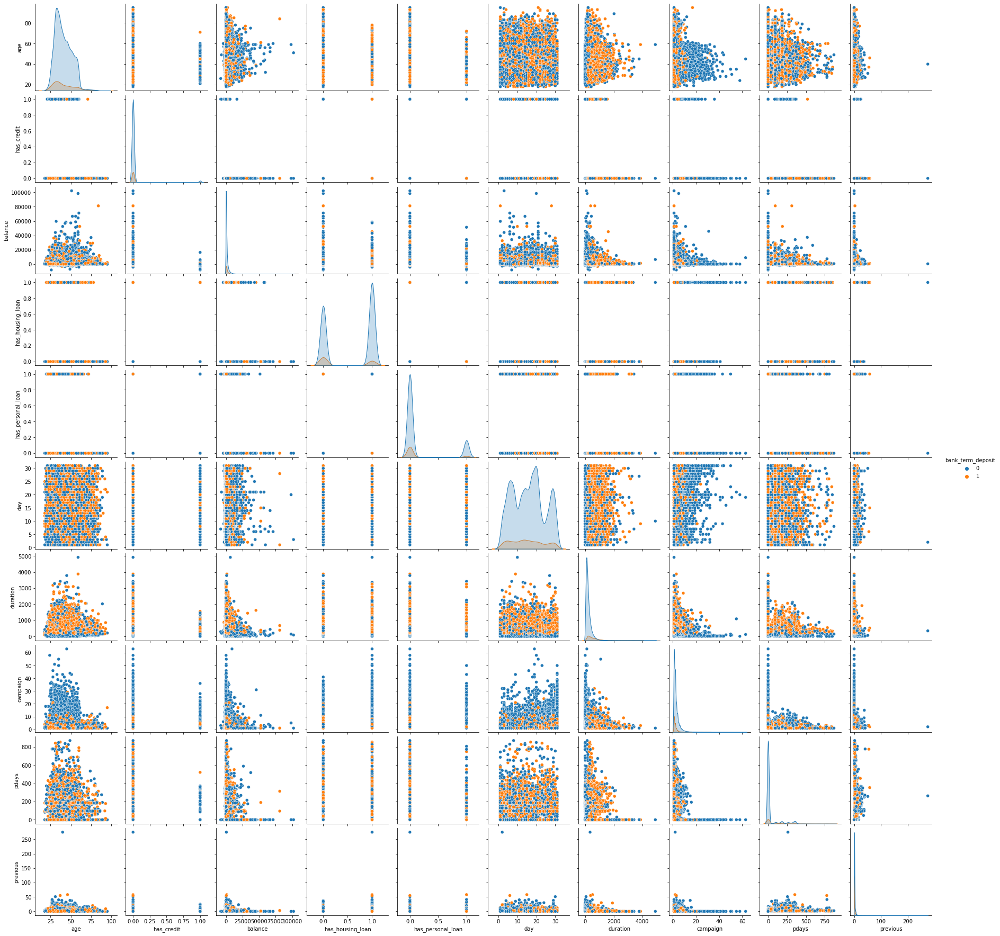

In [96]:
sns.pairplot(df, hue= "bank_term_deposit")

Text(0.5, 1.0, 'Duration Vs Bank Term Deposit')

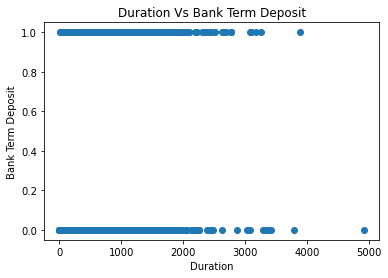

In [97]:
plt.scatter(x='duration',y='bank_term_deposit',data=df)
plt.xlabel('Duration')
plt.ylabel('Bank Term Deposit')
plt.title('Duration Vs Bank Term Deposit')

Text(0.5, 1.0, 'Pdays Vs Bank Term Deposit')

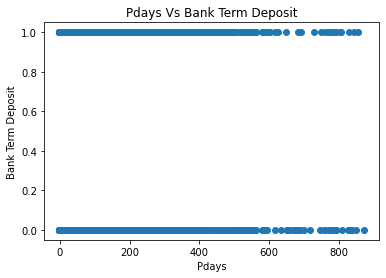

In [98]:
plt.scatter(x='pdays',y='bank_term_deposit',data=df)
plt.xlabel('Pdays')
plt.ylabel('Bank Term Deposit')
plt.title('Pdays Vs Bank Term Deposit')

Text(0.5, 1.0, 'Duration Vs Pdays')

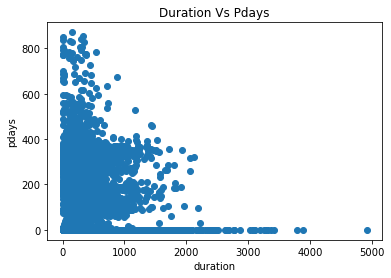

In [99]:
plt.scatter(x='duration',y='pdays',data=df)
plt.xlabel('duration')
plt.ylabel('pdays')
plt.title('Duration Vs Pdays')

[Text(0.5, 1.0, 'Bank Term Deposit Distribution')]

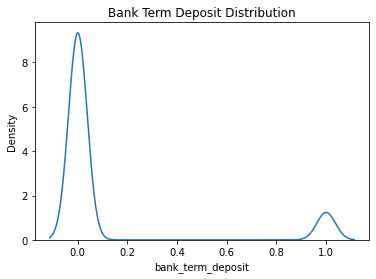

In [100]:
sns.kdeplot(df['bank_term_deposit']).set(title='Bank Term Deposit Distribution')

[Text(0.5, 1.0, 'Duration Distribution')]

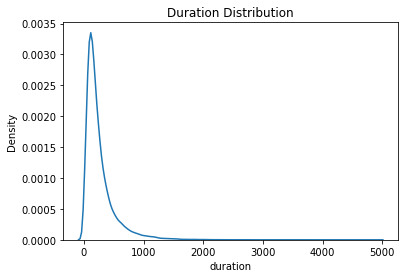

In [101]:
sns.kdeplot(df['duration']).set(title='Duration Distribution')

[Text(0.5, 1.0, 'Pdays Distribution')]

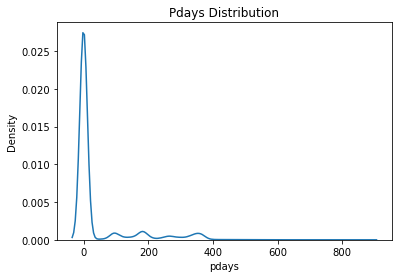

In [102]:
sns.kdeplot(df['pdays']).set(title='Pdays Distribution')

[Text(0.5, 1.0, 'Has Housing Loan Distribution')]

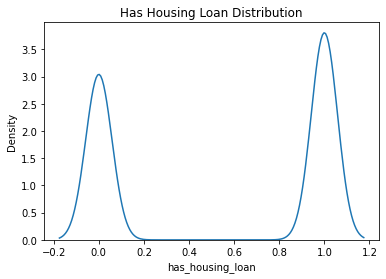

In [109]:
sns.kdeplot(df['has_housing_loan']).set(title='Has Housing Loan Distribution')

[Text(0.5, 1.0, 'Age Distribution')]

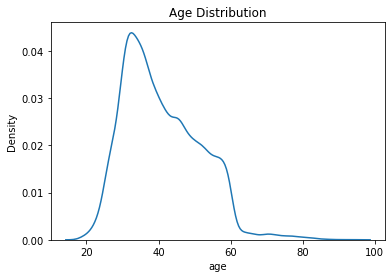

In [103]:
sns.kdeplot(df['age']).set(title='Age Distribution')

[Text(0.5, 1.0, 'Job Distribution')]

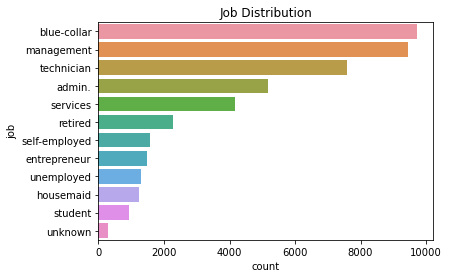

In [104]:
# Look at our target class distribution
sns.countplot(data=df, y='job', order = df['job'].value_counts().index).set(title='Job Distribution')

[Text(0.5, 1.0, 'Marital Distribution')]

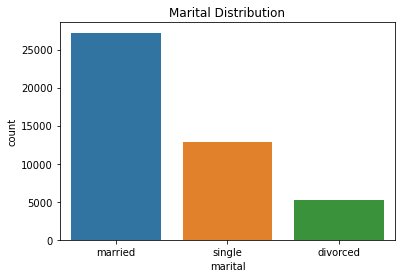

In [105]:
# Look at our target class distribution
sns.countplot(data=df, x='marital', order = df['marital'].value_counts().index).set(title='Marital Distribution')

[Text(0.5, 1.0, 'Education Distribution')]

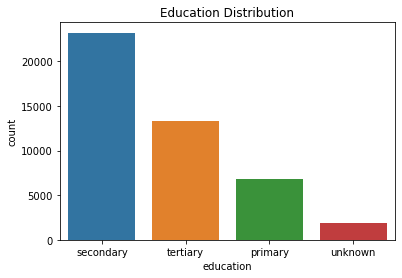

In [106]:
# Look at our target class distribution
sns.countplot(data=df, x='education', order = df['education'].value_counts().index).set(title='Education Distribution')

[Text(0.5, 1.0, 'Contact Communication Type Distribution')]

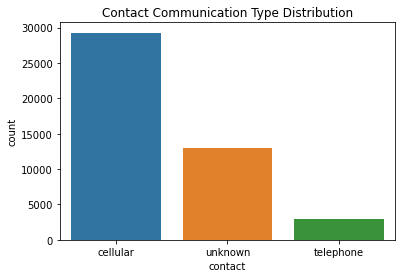

In [110]:
# Look at our target class distribution
sns.countplot(data=df, x='contact', order = df['contact'].value_counts().index).set(title='Contact Communication Type Distribution')

[Text(0.5, 1.0, ' Last Contact Month of Year Distribution')]

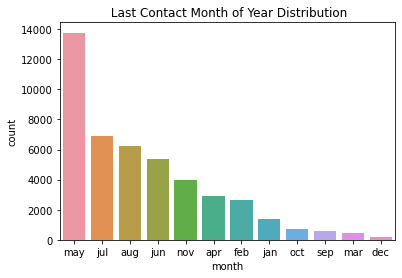

In [111]:
# Look at our target class distribution
sns.countplot(data=df, x='month', order = df['month'].value_counts().index).set(title=' Last Contact Month of Year Distribution')

[Text(0.5, 1.0, 'Outcome of the Previous Marketing Campaign Distribution')]

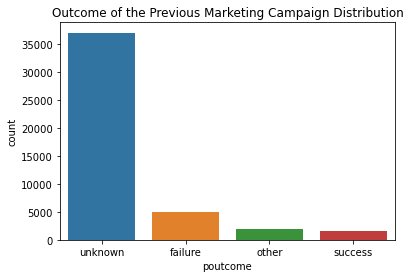

In [112]:
# Look at our target class distribution
sns.countplot(data=df, x='poutcome', order = df['poutcome'].value_counts().index).set(title='Outcome of the Previous Marketing Campaign Distribution')

In [190]:
# Binarize all non numerical columns
df['job'] = df['job'].map({'blue-collar': 0, 'management': 1, 'technician': 2, 'admin.': 3, 'services': 4, 'retired': 5\
                          , 'self-employed': 6, 'entrepreneur': 7, 'unemployed': 8, 'housemaid': 9, 'student': 10,\
                           'unknown': 11})
df['marital'] = df['marital'].map({'married': 1, 'single': 0,'divorced':2})
df['education'] = df['education'].map({'unknown': 0, 'primary': 1, 'tertiary': 2, 'secondary': 3})
df['contact'] = df['contact'].map({'cellular': 1, 'unknown': 0,'telephone':2})
df['month'] = df['month'].map({'jan': 0, 'feb': 1, 'mar': 2, 'apr': 3, 'may': 4, 'jun': 5\
                          , 'jul': 6, 'aug': 7, 'sep': 8, 'oct': 9, 'nov': 10,\
                           'dec': 11})
df['poutcome'] = df['poutcome'].map({'success': 1, 'failure': 0,'other': 2, 'unknown': 3})
df.head()

,age,job,marital,education,has_credit,balance,has_housing_loan,has_personal_loan,contact,day,month,duration,campaign,pdays,previous,poutcome,bank_term_deposit
0,58,1,1,2,0,2143,1,0,0,5,4,261,1,-1,0,3,0
1,44,2,0,3,0,29,1,0,0,5,4,151,1,-1,0,3,0
2,33,7,1,3,0,2,1,1,0,5,4,76,1,-1,0,3,0
3,47,0,1,0,0,1506,1,0,0,5,4,92,1,-1,0,3,0
4,33,11,0,0,0,1,0,0,0,5,4,198,1,-1,0,3,0


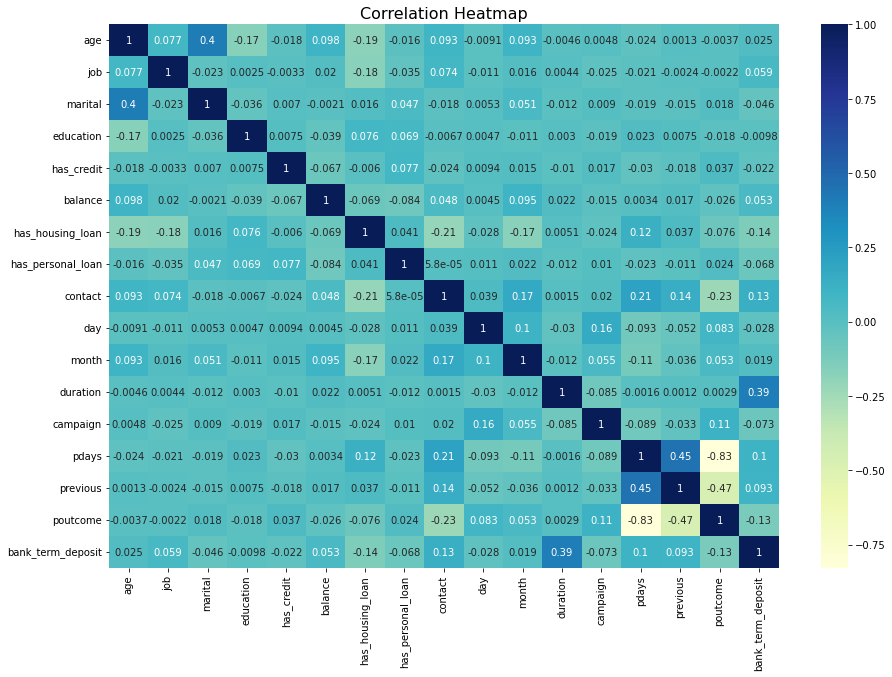

In [191]:
corr=df.corr()# Set the width and height of the figure
plt.figure(figsize=(15,10))
# Add title
plt.title("Correlation Heatmap", size=16)
sns.heatmap(df.corr(), annot=True, cmap="YlGnBu")
#plt.savefig("corr_heatmap.png", format="png", dpi=1200)
plt.show()

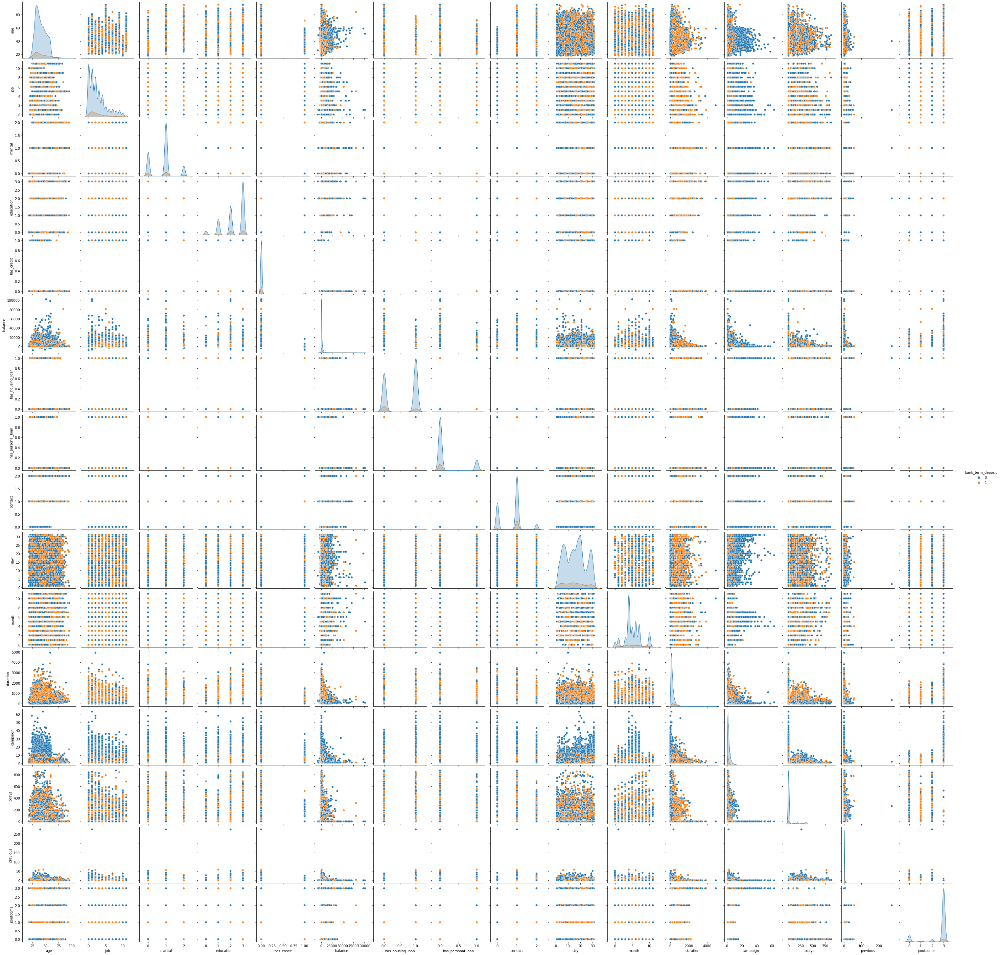

In [192]:
sns.pairplot(df, hue= "bank_term_deposit")

### Random Forest Model For Classification

In [403]:
# For the model I'm gonna choose only the features that have high correlation with the target
df1 = df[['duration','pdays','bank_term_deposit']].copy()

In [412]:
# Split the dataset 

train, test = train_test_split(
    df1,
    test_size=0.2,
    train_size = 0.8,
    random_state=9000
)

In [413]:
# Split the dataset into feature set and target column 

# Note: we are droping the No Column from our feature set 

X_train = train.iloc[:, 0:-1]
y_train = train.iloc[:, -1]

X_test = test.iloc[:, 0:-1]
y_test = test.iloc[:, -1]



In [414]:
print(X_train.shape)
print(X_test.shape)

(36168, 2)
(9043, 2)


In [415]:
# Instantiate Standard Scaler
scaler = StandardScaler()
# Fit & transform data.
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)

In [416]:
class_forest = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)

In [417]:
class_forest.fit(X_train_sc, y_train)

preds_class = class_forest.predict(X_test_sc)

In [418]:
val_train = round(class_forest.score(X_train_sc, y_train),2)*100
val_test = round(class_forest.score(X_test_sc, y_test),2)*100

print(f'Training Accuracy: {val_train}%')
print(f'Test Set Accuracy: {val_test}%')

Training Accuracy: 93.0%
Test Set Accuracy: 89.0%


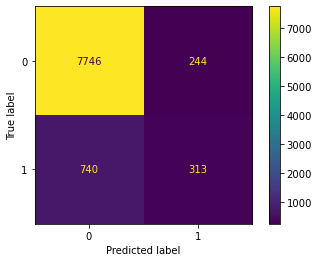

In [419]:
# We can also make a simple confusion matrix
plot_confusion_matrix(class_forest, X_test_sc, y_test);

In [420]:
# Printing the classification report
print(classification_report(y_test, preds_class))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      7990
           1       0.56      0.30      0.39      1053

    accuracy                           0.89      9043
   macro avg       0.74      0.63      0.66      9043
weighted avg       0.87      0.89      0.88      9043



#### Random Forest Model using GridSearch CV Classification

In [421]:
# Classification

param_grid = {
    "n_estimators": [10,20,30], # how many trees in our forest
    "criterion": ["gini", "entropy"], # what criteria is used to split nodes
    "max_depth": [2,4,6] # how deep each decision tree can be
    
}

grid = GridSearchCV(
    class_forest,
    param_grid,
    cv = 5,
    n_jobs=-1,
    verbose=1
)

grid.fit(X_train, y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


GridSearchCV(cv=5,
             estimator=RandomForestClassifier(criterion='entropy',
                                              n_estimators=10, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6], 'n_estimators': [10, 20, 30]},
             verbose=1)

In [422]:
grid_df = pd.DataFrame(grid.cv_results_)

grid_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.062856,0.003190,0.006806,4.004718e-04,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'n_estim...",0.882914,0.882914,0.882776,0.883313,0.882898,0.882963,0.000182,13
1,0.131318,0.007284,0.010409,4.904469e-04,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'n_estim...",0.882914,0.882914,0.882776,0.882898,0.882898,0.882880,0.000053,15
2,0.192775,0.007262,0.014613,8.005858e-04,gini,2,30,"{'criterion': 'gini', 'max_depth': 2, 'n_estim...",0.882914,0.882914,0.882776,0.883313,0.882898,0.882963,0.000182,13
3,0.090883,0.002564,0.007206,3.993512e-04,gini,4,10,"{'criterion': 'gini', 'max_depth': 4, 'n_estim...",0.892452,0.890655,0.893005,0.890640,0.887460,0.890843,0.001938,7
4,0.190773,0.014908,0.012412,2.334309e-03,gini,4,20,"{'criterion': 'gini', 'max_depth': 4, 'n_estim...",0.890379,0.888858,0.891899,0.891193,0.888428,0.890151,0.001329,8
5,0.268845,0.016344,0.016014,3.234067e-07,gini,4,30,"{'criterion': 'gini', 'max_depth': 4, 'n_estim...",0.884573,0.888858,0.893143,0.889672,0.889119,0.889073,0.002729,10
6,0.127115,0.008930,0.008008,1.029350e-06,gini,6,10,"{'criterion': 'gini', 'max_depth': 6, 'n_estim...",0.894249,0.892038,0.894526,0.892299,0.892714,0.893165,0.001025,6
7,0.243421,0.009692,0.014013,3.568323e-07,gini,6,20,"{'criterion': 'gini', 'max_depth': 6, 'n_estim...",0.894526,0.891899,0.895217,0.892714,0.892714,0.893414,0.001246,4
8,0.351920,0.018463,0.020018,4.150759e-03,gini,6,30,"{'criterion': 'gini', 'max_depth': 6, 'n_estim...",0.894526,0.892591,0.895079,0.892852,0.892852,0.893580,0.001018,2
9,0.064459,0.003444,0.006606,4.904270e-04,entropy,2,10,"{'criterion': 'entropy', 'max_depth': 2, 'n_es...",0.882914,0.882914,0.882776,0.882898,0.882898,0.882880,0.000053,15


In [423]:
parameters = ['param_criterion','param_max_depth','param_n_estimators','mean_test_score','rank_test_score']

grid_df[parameters]

,param_criterion,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,gini,2,10,0.882963,13
1,gini,2,20,0.882880,15
2,gini,2,30,0.882963,13
3,gini,4,10,0.890843,7
4,gini,4,20,0.890151,8
5,gini,4,30,0.889073,10
6,gini,6,10,0.893165,6
7,gini,6,20,0.893414,4
8,gini,6,30,0.893580,2
9,entropy,2,10,0.882880,15


In [424]:
grid_df[parameters].sort_values(by = ['rank_test_score'])

,param_criterion,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
17,entropy,6,30,0.894050,1
8,gini,6,30,0.893580,2
16,entropy,6,20,0.893580,3
7,gini,6,20,0.893414,4
15,entropy,6,10,0.893248,5
6,gini,6,10,0.893165,6
3,gini,4,10,0.890843,7
4,gini,4,20,0.890151,8
13,entropy,4,20,0.889322,9
5,gini,4,30,0.889073,10


In [425]:
grid.best_score_

0.8940499227097136

In [426]:
grid.score(X_test, y_test)

0.8958310295255999

In [427]:
# Note: we only choose one possibility --> the one happens first 
grid.best_params_

{'criterion': 'entropy', 'max_depth': 6, 'n_estimators': 30}

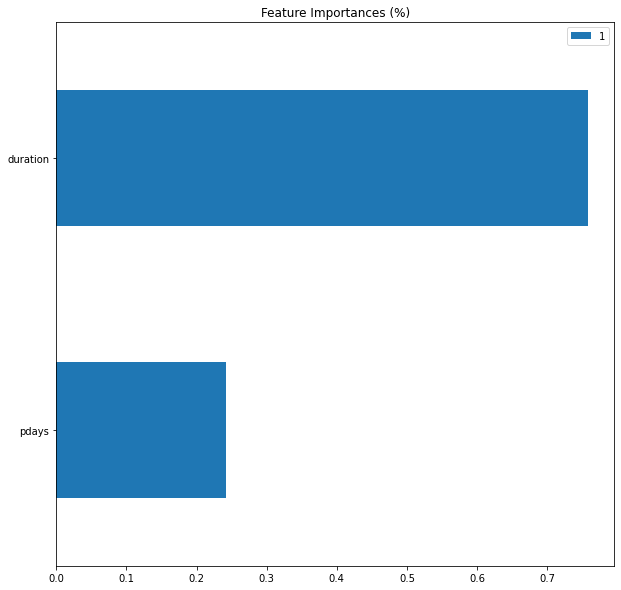

In [428]:
# Plot Feature Importances to Visualize better

pd.DataFrame(dict(zip(X_train.columns, grid.best_estimator_.feature_importances_)), index = [1])\
.T\
.sort_values(1, ascending=True)\
.plot(kind="barh", title="Feature Importances (%)", figsize=(10,10));

In [429]:
grid.best_estimator_.estimators_

[DecisionTreeClassifier(criterion='entropy', max_depth=6, max_features='auto',
                        random_state=209652396),
 DecisionTreeClassifier(criterion='entropy', max_depth=6, max_features='auto',
                        random_state=398764591),
 DecisionTreeClassifier(criterion='entropy', max_depth=6, max_features='auto',
                        random_state=924231285),
 DecisionTreeClassifier(criterion='entropy', max_depth=6, max_features='auto',
                        random_state=1478610112),
 DecisionTreeClassifier(criterion='entropy', max_depth=6, max_features='auto',
                        random_state=441365315),
 DecisionTreeClassifier(criterion='entropy', max_depth=6, max_features='auto',
                        random_state=1537364731),
 DecisionTreeClassifier(criterion='entropy', max_depth=6, max_features='auto',
                        random_state=192771779),
 DecisionTreeClassifier(criterion='entropy', max_depth=6, max_features='auto',
                       

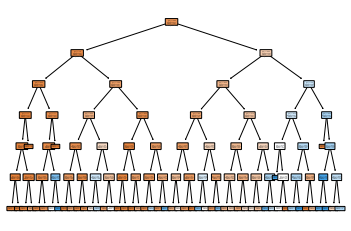

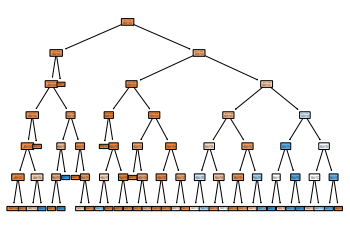

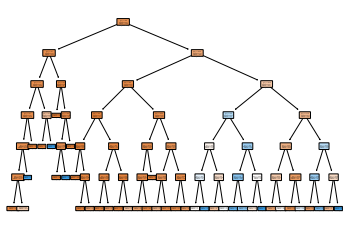

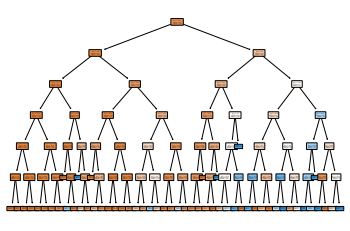

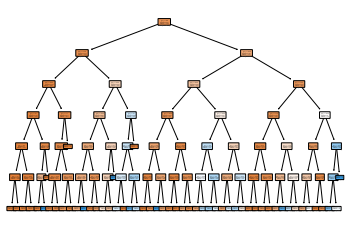

...

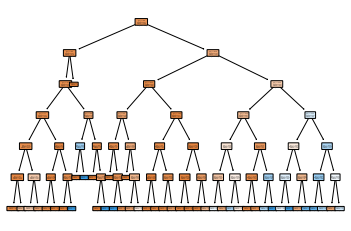

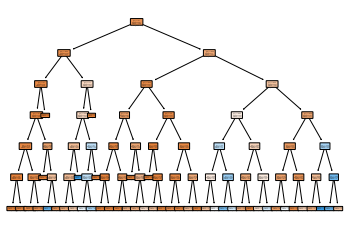

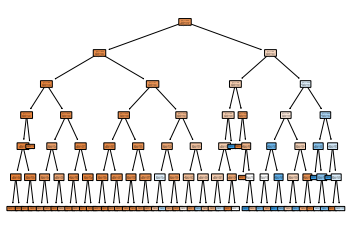

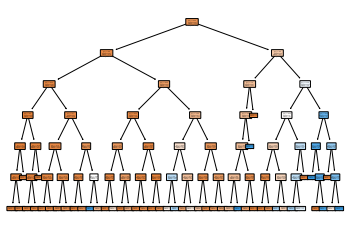

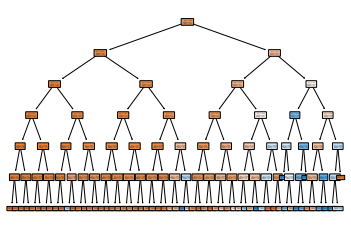

In [430]:
# Plot the Decision Trees from the Grid Search Random Forest
for x in range(len(grid.best_estimator_.estimators_)):
    tree.plot_tree(
    grid.best_estimator_.estimators_[x], # Access each individual estimator
    filled=True,
    rounded=True,
    )
    plt.show()

-------------------------------------------------------------------------------------------------------------------------

-------------------------------------------------------------------------------------------------------------------------

-------------------------------------------------------------------------------------------------------------------------

## 2. U.S. Pollution Dataset

### Load the dataset

In [293]:
US_Pollution_df = pd.read_csv('pollution_us_2000_2016.csv')

### EDA

In [261]:
US_Pollution_df.head()

,Unnamed: 0,State Code,County Code,Site Num,Address,State,County,City,Date Local,NO2 Units,...,SO2 Units,SO2 Mean,SO2 1st Max Value,SO2 1st Max Hour,SO2 AQI,CO Units,CO Mean,CO 1st Max Value,CO 1st Max Hour,CO AQI
0,0,4,13,3002,1645 E ROOSEVELT ST-CENTRAL PHOENIX STN,Arizona,Maricopa,Phoenix,2000-01-01,Parts per billion,...,Parts per billion,3.000000,9.0,21,13.0,Parts per million,1.145833,4.2,21,NaN
1,1,4,13,3002,1645 E ROOSEVELT ST-CENTRAL PHOENIX STN,Arizona,Maricopa,Phoenix,2000-01-01,Parts per billion,...,Parts per billion,3.000000,9.0,21,13.0,Parts per million,0.878947,2.2,23,25.0
2,2,4,13,3002,1645 E ROOSEVELT ST-CENTRAL PHOENIX STN,Arizona,Maricopa,Phoenix,2000-01-01,Parts per billion,...,Parts per billion,2.975000,6.6,23,NaN,Parts per million,1.145833,4.2,21,NaN
3,3,4,13,3002,1645 E ROOSEVELT ST-CENTRAL PHOENIX STN,Arizona,Maricopa,Phoenix,2000-01-01,Parts per billion,...,Parts per billion,2.975000,6.6,23,NaN,Parts per million,0.878947,2.2,23,25.0
4,4,4,13,3002,1645 E ROOSEVELT ST-CENTRAL PHOENIX STN,Arizona,Maricopa,Phoenix,2000-01-02,Parts per billion,...,Parts per billion,1.958333,3.0,22,4.0,Parts per million,0.850000,1.6,23,NaN


In [262]:
US_Pollution_df.shape

(1746661, 29)

In [263]:
US_Pollution_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1746661 entries, 0 to 1746660
Data columns (total 29 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Unnamed: 0         int64  
 1   State Code         int64  
 2   County Code        int64  
 3   Site Num           int64  
 4   Address            object 
 5   State              object 
 6   County             object 
 7   City               object 
 8   Date Local         object 
 9   NO2 Units          object 
 10  NO2 Mean           float64
 11  NO2 1st Max Value  float64
 12  NO2 1st Max Hour   int64  
 13  NO2 AQI            int64  
 14  O3 Units           object 
 15  O3 Mean            float64
 16  O3 1st Max Value   float64
 17  O3 1st Max Hour    int64  
 18  O3 AQI             int64  
 19  SO2 Units          object 
 20  SO2 Mean           float64
 21  SO2 1st Max Value  float64
 22  SO2 1st Max Hour   int64  
 23  SO2 AQI            float64
 24  CO Units           object 
 25  CO Mean           

In [264]:
US_Pollution_df.isnull().sum()

Unnamed: 0                0
State Code                0
County Code               0
Site Num                  0
Address                   0
State                     0
County                    0
City                      0
Date Local                0
NO2 Units                 0
NO2 Mean                  0
NO2 1st Max Value         0
NO2 1st Max Hour          0
NO2 AQI                   0
O3 Units                  0
O3 Mean                   0
O3 1st Max Value          0
O3 1st Max Hour           0
O3 AQI                    0
SO2 Units                 0
SO2 Mean                  0
SO2 1st Max Value         0
SO2 1st Max Hour          0
SO2 AQI              872907
CO Units                  0
CO Mean                   0
CO 1st Max Value          0
CO 1st Max Hour           0
CO AQI               873323
dtype: int64

In [305]:
df2 = US_Pollution_df.dropna()

In [306]:
df2 = df2.reset_index()

In [307]:
df2 = df2.drop(['Unnamed: 0','index'], axis =1)

In [308]:
df2.head()

,State Code,County Code,Site Num,Address,State,County,City,Date Local,NO2 Units,NO2 Mean,...,SO2 Units,SO2 Mean,SO2 1st Max Value,SO2 1st Max Hour,SO2 AQI,CO Units,CO Mean,CO 1st Max Value,CO 1st Max Hour,CO AQI
0,4,13,3002,1645 E ROOSEVELT ST-CENTRAL PHOENIX STN,Arizona,Maricopa,Phoenix,2000-01-01,Parts per billion,19.041667,...,Parts per billion,3.000000,9.0,21,13.0,Parts per million,0.878947,2.2,23,25.0
1,4,13,3002,1645 E ROOSEVELT ST-CENTRAL PHOENIX STN,Arizona,Maricopa,Phoenix,2000-01-02,Parts per billion,22.958333,...,Parts per billion,1.958333,3.0,22,4.0,Parts per million,1.066667,2.3,0,26.0
2,4,13,3002,1645 E ROOSEVELT ST-CENTRAL PHOENIX STN,Arizona,Maricopa,Phoenix,2000-01-03,Parts per billion,38.125000,...,Parts per billion,5.250000,11.0,19,16.0,Parts per million,1.762500,2.5,8,28.0
3,4,13,3002,1645 E ROOSEVELT ST-CENTRAL PHOENIX STN,Arizona,Maricopa,Phoenix,2000-01-04,Parts per billion,40.260870,...,Parts per billion,7.083333,16.0,8,23.0,Parts per million,1.829167,3.0,23,34.0
4,4,13,3002,1645 E ROOSEVELT ST-CENTRAL PHOENIX STN,Arizona,Maricopa,Phoenix,2000-01-05,Parts per billion,48.450000,...,Parts per billion,8.708333,15.0,7,21.0,Parts per million,2.700000,3.7,2,42.0


In [309]:
df2.shape

(436876, 28)

In [310]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 436876 entries, 0 to 436875
Data columns (total 28 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   State Code         436876 non-null  int64  
 1   County Code        436876 non-null  int64  
 2   Site Num           436876 non-null  int64  
 3   Address            436876 non-null  object 
 4   State              436876 non-null  object 
 5   County             436876 non-null  object 
 6   City               436876 non-null  object 
 7   Date Local         436876 non-null  object 
 8   NO2 Units          436876 non-null  object 
 9   NO2 Mean           436876 non-null  float64
 10  NO2 1st Max Value  436876 non-null  float64
 11  NO2 1st Max Hour   436876 non-null  int64  
 12  NO2 AQI            436876 non-null  int64  
 13  O3 Units           436876 non-null  object 
 14  O3 Mean            436876 non-null  float64
 15  O3 1st Max Value   436876 non-null  float64
 16  O3

In [311]:
df2.isnull().sum()

State Code           0
County Code          0
Site Num             0
Address              0
State                0
County               0
City                 0
Date Local           0
NO2 Units            0
NO2 Mean             0
NO2 1st Max Value    0
NO2 1st Max Hour     0
NO2 AQI              0
O3 Units             0
O3 Mean              0
O3 1st Max Value     0
O3 1st Max Hour      0
O3 AQI               0
SO2 Units            0
SO2 Mean             0
SO2 1st Max Value    0
SO2 1st Max Hour     0
SO2 AQI              0
CO Units             0
CO Mean              0
CO 1st Max Value     0
CO 1st Max Hour      0
CO AQI               0
dtype: int64

In [312]:
df2.describe()

,State Code,County Code,Site Num,NO2 Mean,NO2 1st Max Value,NO2 1st Max Hour,NO2 AQI,O3 Mean,O3 1st Max Value,O3 1st Max Hour,O3 AQI,SO2 Mean,SO2 1st Max Value,SO2 1st Max Hour,SO2 AQI,CO Mean,CO 1st Max Value,CO 1st Max Hour,CO AQI
count,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000,436876.000000
mean,22.309507,71.684636,1118.540066,12.822498,25.415907,11.730919,23.899230,0.026124,0.039203,10.170449,36.049204,1.881679,5.252270,8.789505,7.117386,0.369723,0.529222,6.255095,5.996258
std,17.257025,79.473190,2003.438008,9.505716,16.000756,7.877633,15.163655,0.011369,0.015343,4.003316,19.779243,2.761864,8.949573,6.803115,11.939231,0.316364,0.509962,7.842019,5.851589
min,1.000000,1.000000,1.000000,-2.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-2.000000,-2.000000,0.000000,0.000000,-0.437500,-0.400000,0.000000,0.000000
25%,6.000000,17.000000,9.000000,5.750000,13.000000,5.000000,12.000000,0.017875,0.029000,9.000000,25.000000,0.265217,1.000000,3.000000,1.000000,0.191667,0.200000,0.000000,2.000000
50%,17.000000,59.000000,60.000000,10.739130,24.000000,9.000000,23.000000,0.025875,0.038000,10.000000,33.000000,1.000000,2.000000,8.000000,3.000000,0.295833,0.400000,2.000000,5.000000
75%,40.000000,97.000000,1039.000000,17.714286,35.700000,20.000000,33.000000,0.033917,0.048000,11.000000,42.000000,2.333333,6.000000,13.000000,9.000000,0.470833,0.700000,10.000000,8.000000
max,80.000000,650.000000,9997.000000,139.541667,267.000000,23.000000,132.000000,0.095083,0.141000,23.000000,218.000000,321.625000,351.000000,23.000000,200.000000,7.508333,15.500000,23.000000,201.000000


In [313]:
df2.describe(exclude='number')

,Address,State,County,City,Date Local,NO2 Units,O3 Units,SO2 Units,CO Units
count,436876,436876,436876,436876,436876,436876,436876,436876,436876
unique,204,47,133,144,5996,1,1,1,1
top,PIKE AVE AT RIVER ROAD,California,Los Angeles,Not in a city,2002-06-10,Parts per billion,Parts per million,Parts per billion,Parts per million
freq,8832,144109,23405,34619,160,436876,436876,436876,436876


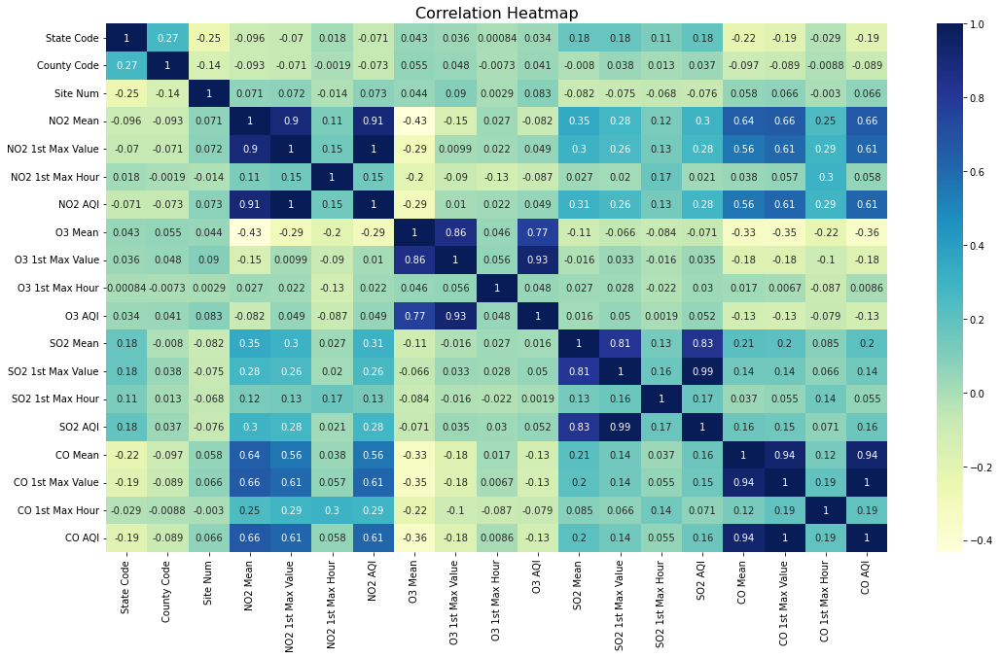

In [314]:
corr=df2.corr()# Set the width and height of the figure
plt.figure(figsize=(18,10))
# Add title
plt.title("Correlation Heatmap", size=16)
sns.heatmap(df2.corr(), annot=True, cmap="YlGnBu")
#plt.savefig("corr_heatmap.png", format="png", dpi=1200)
plt.show()

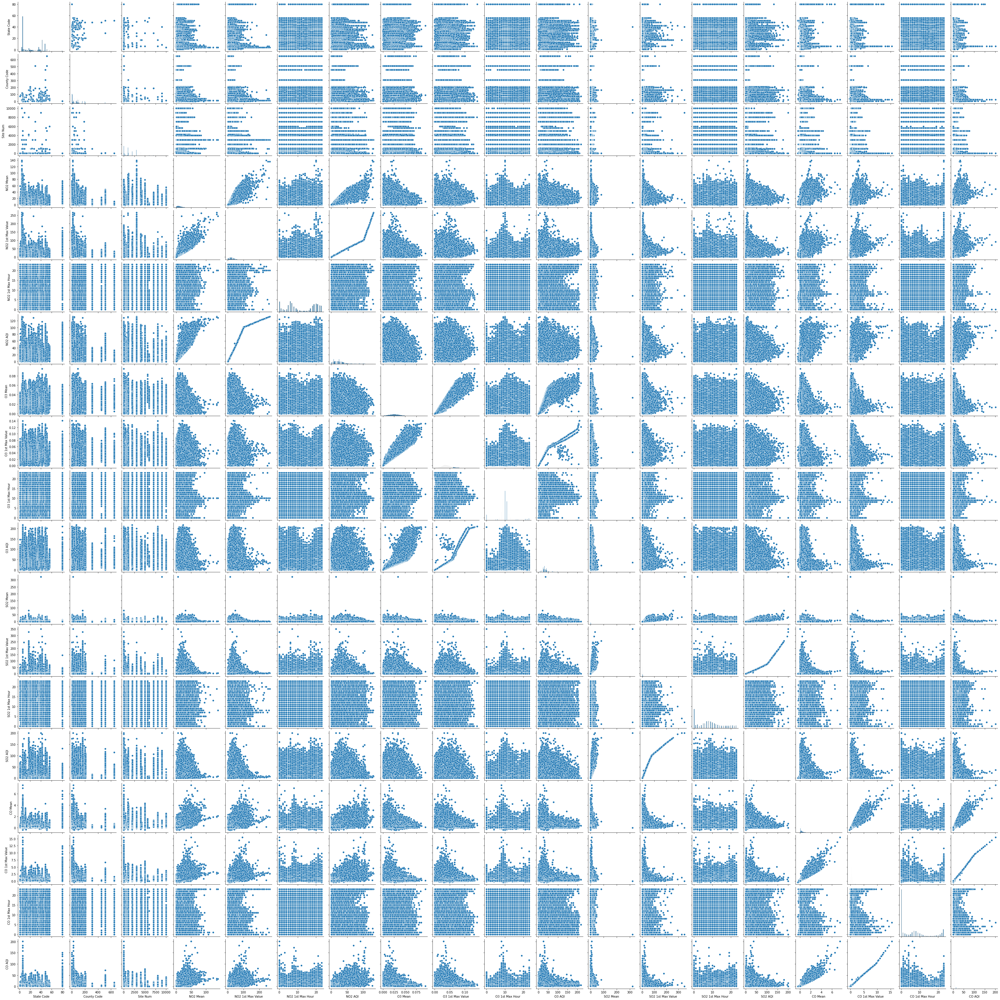

In [315]:
sns.pairplot(df2)

Text(0.5, 1.0, 'CO 1st Max Value Vs CO AQI')

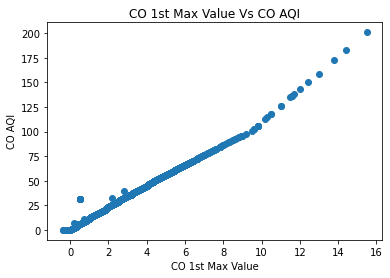

In [292]:
plt.scatter(x='CO 1st Max Value',y='CO AQI',data=df2)
plt.xlabel('CO 1st Max Value')
plt.ylabel('CO AQI')
plt.title('CO 1st Max Value Vs CO AQI')

Text(0.5, 1.0, 'CO Mean Vs CO AQI')

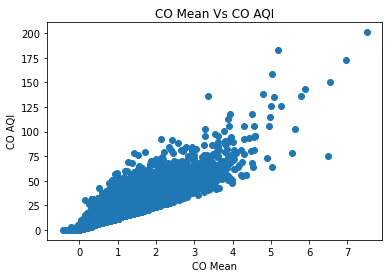

In [317]:
plt.scatter(x='CO Mean',y='CO AQI',data=df2)
plt.xlabel('CO Mean')
plt.ylabel('CO AQI')
plt.title('CO Mean Vs CO AQI')

Text(0.5, 1.0, 'NO2 Mean Vs CO AQI')

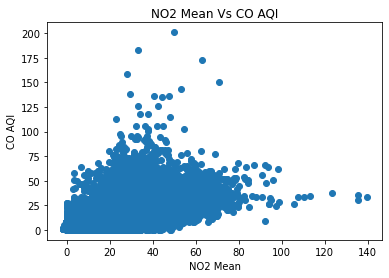

In [318]:
plt.scatter(x='NO2 Mean',y='CO AQI',data=df2)
plt.xlabel('NO2 Mean')
plt.ylabel('CO AQI')
plt.title('NO2 Mean Vs CO AQI')

Text(0.5, 1.0, 'NO2 1st Max Value Vs CO AQI')

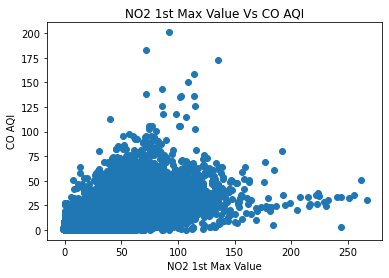

In [319]:
plt.scatter(x='NO2 1st Max Value',y='CO AQI',data=df2)
plt.xlabel('NO2 1st Max Value')
plt.ylabel('CO AQI')
plt.title('NO2 1st Max Value Vs CO AQI')

[Text(0.5, 1.0, 'CO AQI Distribution')]

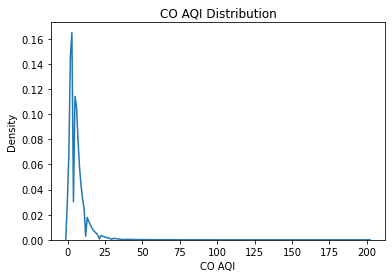

In [320]:
sns.kdeplot(df2['CO AQI']).set(title='CO AQI Distribution')

[Text(0.5, 1.0, 'CO 1st Max Value Distribution')]

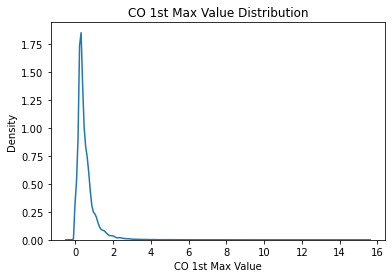

In [321]:
sns.kdeplot(df2['CO 1st Max Value']).set(title='CO 1st Max Value Distribution')

[Text(0.5, 1.0, 'CO Mean Distribution')]

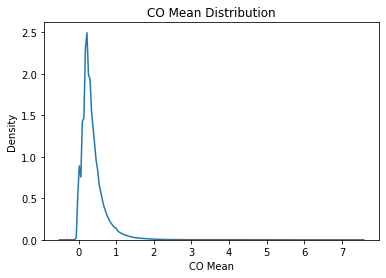

In [322]:
sns.kdeplot(df2['CO Mean']).set(title='CO Mean Distribution')

[Text(0.5, 1.0, 'NO2 Mean Distribution')]

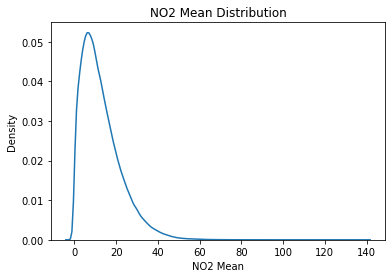

In [323]:
sns.kdeplot(df2['NO2 Mean']).set(title='NO2 Mean Distribution')

[Text(0.5, 1.0, 'NO2 1st Max Value Distribution')]

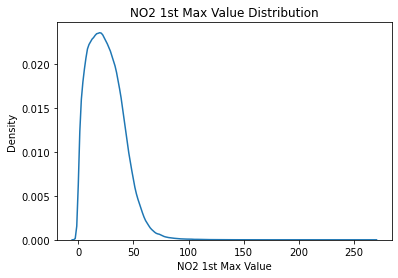

In [324]:
sns.kdeplot(df2['NO2 1st Max Value']).set(title='NO2 1st Max Value Distribution')

In [339]:
df2.columns

Index(['State Code', 'County Code', 'Site Num', 'Address', 'State', 'County',
       'City', 'Date Local', 'NO2 Units', 'NO2 Mean', 'NO2 1st Max Value',
       'NO2 1st Max Hour', 'NO2 AQI', 'O3 Units', 'O3 Mean',
       'O3 1st Max Value', 'O3 1st Max Hour', 'O3 AQI', 'SO2 Units',
       'SO2 Mean', 'SO2 1st Max Value', 'SO2 1st Max Hour', 'SO2 AQI',
       'CO Units', 'CO Mean', 'CO 1st Max Value', 'CO 1st Max Hour', 'CO AQI'],
      dtype='object')

### Random Forest Model For Regression

In [359]:
# df2_2 = df2[['State Code','County Code','Site Num','NO2 Mean','NO2 1st Max Value','NO2 1st Max Hour','NO2 AQI','O3 Mean',\
#         'O3 1st Max Value','O3 1st Max Hour','O3 AQI','SO2 Mean','SO2 1st Max Value','SO2 1st Max Hour','SO2 AQI',\
#         'CO Mean','CO 1st Max Value','CO 1st Max Hour','CO AQI']].copy()

In [382]:
# For the model I'm gonna choose only the features that have high correlation with the target
df2_2 = df2[['NO2 Mean','NO2 1st Max Value','NO2 AQI','CO Mean','CO 1st Max Value','CO AQI']].copy()

In [383]:
# Split the dataset 

train2, test2 = train_test_split(
    df2_2,
    test_size=0.2,
    train_size = 0.8,
    random_state=9000
)

In [384]:
# Split the dataset into feature set and target column 

X_train2 = train2.iloc[:, 0:-1]
y_train2 = train2.iloc[:, -1]

X_test2 = test2.iloc[:, 0:-1]
y_test2 = test2.iloc[:, -1]

In [385]:
print(X_train2.shape)
print(X_test2.shape)

(349500, 5)
(87376, 5)


In [386]:
# Instantiate Standard Scaler
scaler = StandardScaler()
# Fit & transform data.
X_train_sc2 = scaler.fit_transform(X_train2)
X_test_sc2 = scaler.transform(X_test2)

In [390]:
reg_forest = RandomForestRegressor(n_estimators = 10, random_state = 0, criterion = 'mse')

reg_forest.fit(X_train_sc2, y_train2)

preds_forest2 = reg_forest.predict(X_test_sc2)

mean_absolute_error(y_true=y_test2, y_pred=preds_forest2)

0.0002735304889214429

In [391]:
val_train2 = round(reg_forest.score(X_train_sc2, y_train2), 2)*100
val_test2 = round(reg_forest.score(X_test_sc2, y_test2), 2)*100

print(f'Training Accuracy: {val_train2}%')
print(f'Test Set Accuracy: {val_test2}%')

Training Accuracy: 100.0%
Test Set Accuracy: 100.0%


In [392]:
reg_forest.feature_importances_

array([5.64246192e-04, 2.32995418e-04, 2.41111210e-05, 2.01086078e-03,
       9.97167786e-01])

In [439]:
X_train2.columns

Index(['NO2 Mean', 'NO2 1st Max Value', 'NO2 AQI', 'CO Mean',
       'CO 1st Max Value'],
      dtype='object')

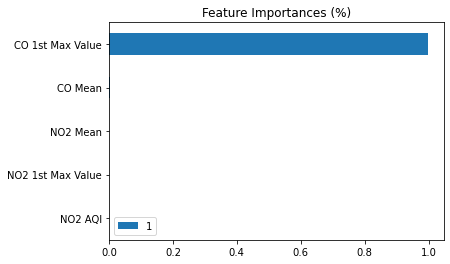

In [440]:
# Plot Feature Importances to Visualize better

pd.DataFrame(dict(zip(X_train2.columns, reg_forest.feature_importances_)), index = [1])\
.T\
.sort_values(1, ascending=True)\
.plot(kind="barh", title="Feature Importances (%)");

### Random Forest Model using GridSearch CV Regression

In [444]:
# Regression

param_grid2 = {
    "n_estimators": [5,6,10], # how many trees in our forest
    "max_depth": [2,4,6] # how deep each decision tree can be
    
}

grid2 = GridSearchCV(
    reg_forest,
    param_grid2,
    cv = 5,
    n_jobs=-1,
    verbose=1,
    scoring="neg_mean_absolute_error"
)

grid2.fit(X_train2, y_train2)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


GridSearchCV(cv=5,
             estimator=RandomForestRegressor(criterion='mse', n_estimators=10,
                                             random_state=0),
             n_jobs=-1,
             param_grid={'max_depth': [2, 4, 6], 'n_estimators': [5, 6, 10]},
             scoring='neg_mean_absolute_error', verbose=1)

In [445]:
grid_df2 = pd.DataFrame(grid2.cv_results_)

grid_df2

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.362439,0.022607,0.018819,0.001941,2,5,"{'max_depth': 2, 'n_estimators': 5}",-1.364082,-1.363624,-1.359300,-1.351287,-1.376921,-1.363043,0.008321,9
1,1.650902,0.026075,0.018417,0.002420,2,6,"{'max_depth': 2, 'n_estimators': 6}",-1.365772,-1.365725,-1.358976,-1.350303,-1.373482,-1.362852,0.007775,8
2,2.614978,0.049525,0.025223,0.003373,2,10,"{'max_depth': 2, 'n_estimators': 10}",-1.363919,-1.359499,-1.361945,-1.355927,-1.367205,-1.361699,0.003833,7
3,2.496470,0.040482,0.025023,0.003953,4,5,"{'max_depth': 4, 'n_estimators': 5}",-0.251773,-0.252965,-0.252499,-0.243952,-0.257315,-0.251701,0.004332,6
4,2.963896,0.082890,0.025824,0.002402,4,6,"{'max_depth': 4, 'n_estimators': 6}",-0.253111,-0.254852,-0.249924,-0.242977,-0.256646,-0.251502,0.004805,5
5,4.782351,0.072957,0.030027,0.003903,4,10,"{'max_depth': 4, 'n_estimators': 10}",-0.251703,-0.247863,-0.245289,-0.244686,-0.253236,-0.248556,0.003404,4
6,2.932067,0.080975,0.025424,0.002656,6,5,"{'max_depth': 6, 'n_estimators': 5}",-0.013083,-0.015562,-0.014472,-0.014130,-0.013915,-0.014232,0.000807,3
7,3.203515,0.130732,0.021219,0.003189,6,6,"{'max_depth': 6, 'n_estimators': 6}",-0.013352,-0.015873,-0.014342,-0.013375,-0.013385,-0.014065,0.000979,2
8,3.320220,0.493605,0.027625,0.001856,6,10,"{'max_depth': 6, 'n_estimators': 10}",-0.012582,-0.014303,-0.014037,-0.012241,-0.012749,-0.013183,0.000827,1


In [446]:
parameters2 = ['param_max_depth','param_n_estimators','mean_test_score','rank_test_score']

grid_df2[parameters2]

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
0,2,5,-1.363043,9
1,2,6,-1.362852,8
2,2,10,-1.361699,7
3,4,5,-0.251701,6
4,4,6,-0.251502,5
5,4,10,-0.248556,4
6,6,5,-0.014232,3
7,6,6,-0.014065,2
8,6,10,-0.013183,1


In [447]:
grid_df2[parameters2].sort_values(by = ['rank_test_score'])

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score
8,6,10,-0.013183,1
7,6,6,-0.014065,2
6,6,5,-0.014232,3
5,4,10,-0.248556,4
4,4,6,-0.251502,5
3,4,5,-0.251701,6
2,2,10,-1.361699,7
1,2,6,-1.362852,8
0,2,5,-1.363043,9


In [448]:
grid2.best_score_

-0.013182583471202472

In [449]:
grid2.best_params_

{'max_depth': 6, 'n_estimators': 10}

In [401]:
grid2.best_estimator_.estimators_

[DecisionTreeRegressor(max_depth=6, max_features='auto', random_state=209652396),
 DecisionTreeRegressor(max_depth=6, max_features='auto', random_state=398764591),
 DecisionTreeRegressor(max_depth=6, max_features='auto', random_state=924231285),
 DecisionTreeRegressor(max_depth=6, max_features='auto', random_state=1478610112),
 DecisionTreeRegressor(max_depth=6, max_features='auto', random_state=441365315),
 DecisionTreeRegressor(max_depth=6, max_features='auto', random_state=1537364731),
 DecisionTreeRegressor(max_depth=6, max_features='auto', random_state=192771779),
 DecisionTreeRegressor(max_depth=6, max_features='auto', random_state=1491434855),
 DecisionTreeRegressor(max_depth=6, max_features='auto', random_state=1819583497),
 DecisionTreeRegressor(max_depth=6, max_features='auto', random_state=530702035)]

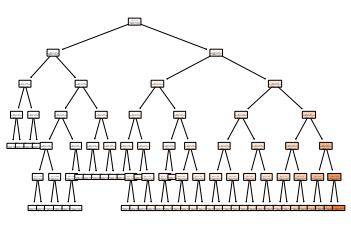

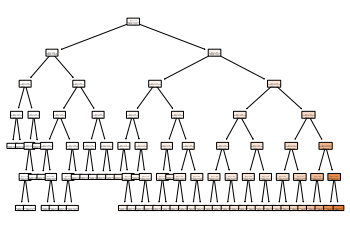

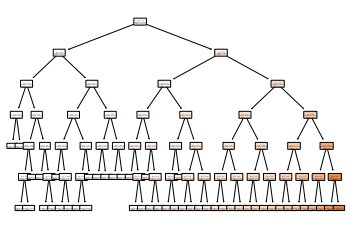

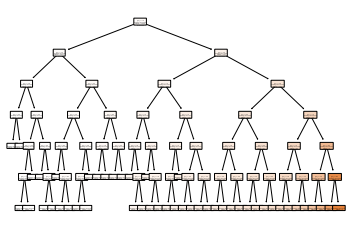

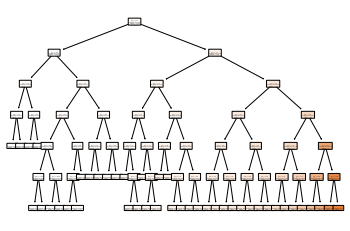

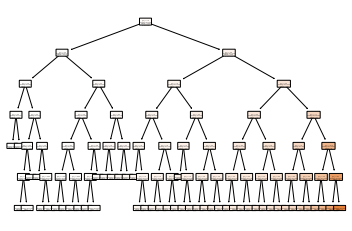

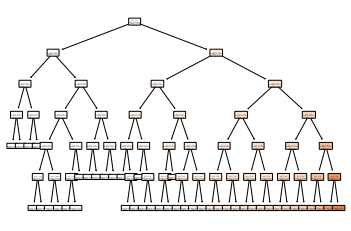

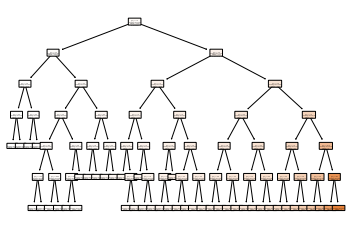

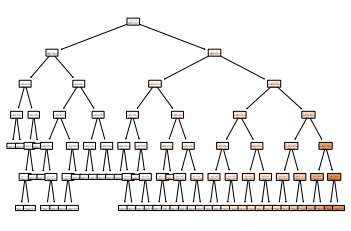

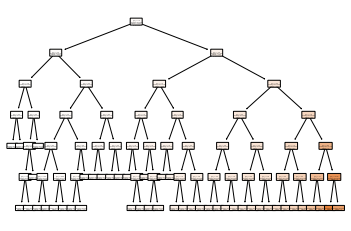

In [402]:
# Plot the Decision Trees from the Grid Search Random Forest

for x in range(len(grid2.best_estimator_.estimators_)):
    tree.plot_tree(
    grid2.best_estimator_.estimators_[x], # Access each individual estimator
    filled=True,
    rounded=True,
    )
    plt.show()